### A Neural Algorithm of Artistic Style

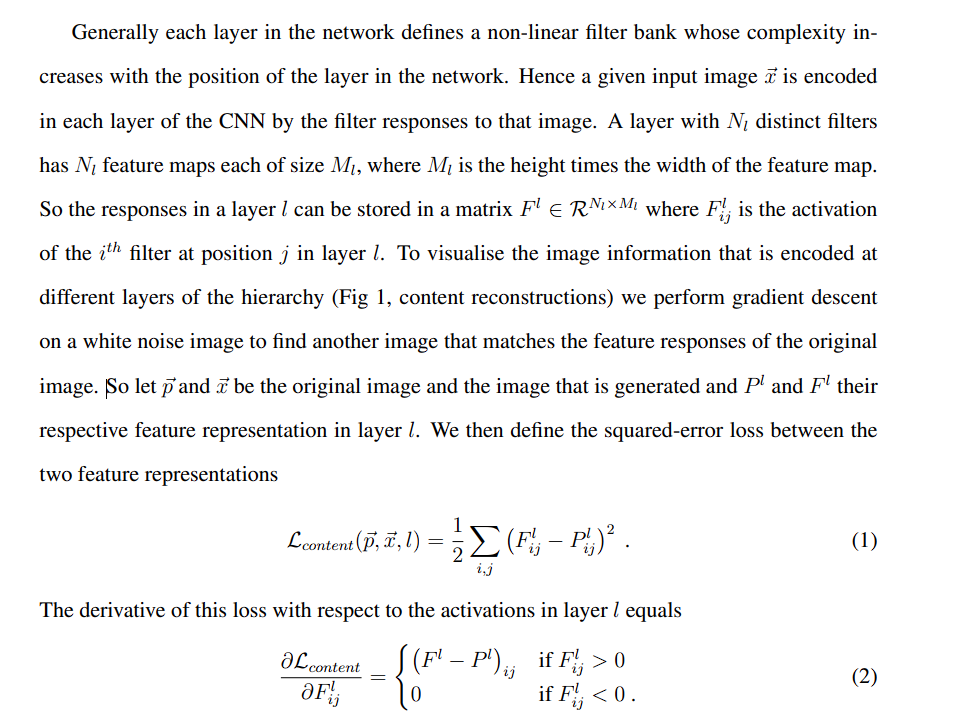

### My Custom VGG-19 Implementation

In [1]:
import torch
import torch.nn as nn

config = {
    # ------------------------------- ConvNets Configurations -------------------------------
    "conv_kernel_size": 3,
    "conv_stride": 1,
    "padding": 1,
    "max_pool_stride": 2,
    "max_pool_kernel_size": 2,
    "hidden_channel_layer_1": 64,
    # ------------------------------- Fully Connected Layer Configurations -------------------------------
    "fc_in_features": 25088, # Output tensor of 16 ConvNets  = [B, 512, 7, 7] | flattening = 512 * 7 * 7 = 25088
    "fc_hidden_dim": 4096, 
    "n_classes": 200,

    # ------------------------------- VGG-19 Model Specific Configurations -------------------------------
    "in_channels": 3,
    "optimizer": "SGD", # (According to Original VGG-19 Paper)
    "weight_decay": 5e-4,
    "lr": 0.001,
    "momentum": 0.9,
    "batch_size": 24,
    "epochs": 200, # I have early Stopping configured

    # ------------------------------ Image Configurations -------------------------------
    "img_size": 224,
}

class VGGBlock(nn.Module):
    """
    Implements a reusable VGG building block.

    I wanted the VGG implementation to be modular so that different
    VGG variants can be created without repeating code. After studying
    the original architecture, I noticed that each stage follows the
    same pattern:

        Conv2D -> ReLU -> ... -> MaxPool

    The only thing that changes between stages is the number of
    convolution layers. This block abstracts that pattern and allows
    a stage to be created by simply specifying the number of
    convolution layers required.

    This keeps the implementation cleaner, easier to maintain,
    and closer to the design of the original paper.

    Paper:
    Very Deep Convolutional Networks for Large-Scale Image Recognition
    https://arxiv.org/pdf/1409.1556
    """
    def __init__(self,
                in_channels: int,
                hidden_channels: int,
                conv_kernel_size: int = config["conv_kernel_size"],
                conv_stride: int = config["conv_stride"],
                padding: int = config["padding"],
                debug: bool = False):
                
                super(VGGBlock, self).__init__()

                self.debug = debug

                self.conv_1 = nn.Conv2d(
                    in_channels = in_channels,
                    out_channels = hidden_channels,
                    kernel_size = conv_kernel_size,
                    stride = conv_stride,
                    padding = padding
                )
                self.batch_norm_1 = nn.BatchNorm2d(hidden_channels)
                self.batch_norm_2 = nn.BatchNorm2d(hidden_channels)

                self.relu = nn.ReLU()

                self.conv_2 = nn.Conv2d(
                    in_channels = hidden_channels,
                    out_channels = hidden_channels,
                    kernel_size = conv_kernel_size,
                    stride = conv_stride,
                    padding = padding
                )

                # self.block = nn.Sequential(
                #     self.conv_1, self.relu, self.conv_2, self.relu
                # )
                self.block = nn.Sequential(
                    self.conv_1, self.batch_norm_1, self.relu, self.conv_2, self.batch_norm_2, self.relu
                )
    
    def forward(self, x: torch.Tensor):
        if self.debug:
            for i, layer in enumerate(self.block):
                x = layer(x)
                print(f"Layer {i:02d} ({layer.__class__.__name__}): {x.shape}")
            return x

        return self.block(x)

class MaxPool2d(nn.Module):
    """
    This class implements the max-pooling operation used throughout the
    VGG-19 architecture.

    Max pooling reduces the spatial resolution of feature maps while
    preserving the most dominant activations within each local region.
    This operation increases the receptive field of subsequent layers
    and improves computational efficiency by progressively downsampling
    the feature representations.

    Paper:
    Very Deep Convolutional Networks for Large-Scale Image Recognition

    Link:
    https://arxiv.org/pdf/1409.1556
    """
    def __init__(self,
            max_pool_stride: int = config["max_pool_stride"],
            max_pool_kernel_size: int = config["max_pool_kernel_size"]):
        
        super(MaxPool2d, self).__init__()
        
        self.max_pool_stride = max_pool_stride
        self.max_pool_kernel_size = max_pool_kernel_size

        self.max_pool2d = nn.MaxPool2d(
            kernel_size = self.max_pool_kernel_size,
            stride = self.max_pool_stride
        )
    
    def forward(self, x: torch.Tensor):
        return self.max_pool2d(x)

class ConvNets(nn.Module):
    """
    This class implements the convolutional feature extraction backbone of
    the VGG-19 architecture.

    The backbone is composed of stacked VGG blocks and max-pooling layers
    that progressively transform the input image into high-level feature
    representations. Spatial resolution is reduced through pooling while
    the number of feature channels is increased, enabling hierarchical
    feature learning across multiple scales.

    Paper:
    Very Deep Convolutional Networks for Large-Scale Image Recognition

    Link:
    https://arxiv.org/pdf/1409.1556
    """
    def __init__(self,
                in_channels: int,
                conv_kernel_size: int = config["conv_kernel_size"],
                conv_stride: int = config["conv_stride"],
                padding: int = config["padding"],
                max_pool_stride: int = config["max_pool_stride"],
                max_pool_kernel_size: int = config["max_pool_kernel_size"],
                debug: bool = False):
        super(ConvNets, self).__init__()
        self.in_channels = in_channels
        prev_channels = config["hidden_channel_layer_1"]

        # Inserting 1st Layer (3 channel -> 64 channels) + MaxPool [2 ConvNets + ReLU]
        self.vgg_19_blocks = [
            nn.Sequential(VGGBlock(
                    in_channels = self.in_channels,
                    hidden_channels = config["hidden_channel_layer_1"],
                    conv_kernel_size = conv_kernel_size,
                    conv_stride = conv_stride,
                    padding = padding,
                    debug = debug
            ), MaxPool2d(
                max_pool_stride = max_pool_stride,
                max_pool_kernel_size = max_pool_kernel_size
            ))
        ]
 
        # Inserting 2nd Layer (64 channel -> 128 channels) + MaxPool [2 ConvNets + ReLU]
        self.vgg_19_blocks.append(
            nn.Sequential(VGGBlock(
                in_channels = prev_channels,
                hidden_channels = 2 * prev_channels,
                conv_kernel_size = conv_kernel_size,
                conv_stride = conv_stride,
                padding = padding,
                debug = debug
            ),
            MaxPool2d(
                max_pool_stride = max_pool_stride,
                max_pool_kernel_size = max_pool_kernel_size
            ))
        )
        prev_channels *= 2

        # Inserting remaining 8 ConvNets + 2 MaxPools
        for _ in range(2):
            self.vgg_19_blocks.append(
                nn.Sequential(
                # 2 set of ConvNets with ReLU
                VGGBlock(
                    in_channels = prev_channels,
                    hidden_channels = 2 * prev_channels,
                    conv_kernel_size = conv_kernel_size,
                    conv_stride = conv_stride,
                    padding = padding,
                    debug = debug
                ),
                # Again 2 set of ConvNets with ReLU
                VGGBlock(
                    in_channels = 2 * prev_channels,
                    hidden_channels = 2 * prev_channels,
                    conv_kernel_size = conv_kernel_size,
                    conv_stride = conv_stride,
                    padding = padding,
                    debug = debug
                ),
                # MaxPool at the end of 4 consecutive ConvNets
                MaxPool2d(
                    max_pool_stride = max_pool_stride,
                    max_pool_kernel_size = max_pool_kernel_size
                ))
            )
            prev_channels *= 2

        # Insterting Last set of 4 ConvNets + 1 MaxPool
        self.vgg_19_blocks.append(
            nn.Sequential(
            # 2 set of ConvNets with ReLU
            VGGBlock(
                in_channels = prev_channels,
                hidden_channels = prev_channels,
                conv_kernel_size = conv_kernel_size,
                conv_stride = conv_stride,
                padding = padding,
                debug = debug
            ),
            # Again 2 set of ConvNets with ReLU
            VGGBlock(
                in_channels = prev_channels,
                hidden_channels = prev_channels,
                conv_kernel_size = conv_kernel_size,
                conv_stride = conv_stride,
                padding = padding,
                debug = debug
            ),

            # MaxPool at the end of 4 consecutive ConvNets
            MaxPool2d(
                max_pool_stride = max_pool_stride,
                max_pool_kernel_size = max_pool_kernel_size
            ))
        )
        self.vgg_19_layers = nn.Sequential(*self.vgg_19_blocks)
    
    def forward(self, x: torch.Tensor):
        return self.vgg_19_layers(x)  

class FullyConnectedLayer(nn.Module):
    """
    This class implements the fully connected classification head of the
    VGG-19 architecture.

    The classifier consists of three linear layers with ReLU activations
    that transform high-level convolutional features into class scores.
    Prior to entering this module, spatial feature maps are flattened into
    a one-dimensional feature vector, enabling image-level classification.

    Paper:
    Very Deep Convolutional Networks for Large-Scale Image Recognition

    Link:
    https://arxiv.org/pdf/1409.1556
    """
    def __init__(self,
                in_features: int,
                hidden_dim: int,
                out_features: int):
        super().__init__()
        self.in_features = in_features
        self.hidden_dim = hidden_dim
        self.out_features = out_features

        self.linear_layer_1 = nn.Linear(in_features = self.in_features, out_features = self.hidden_dim)
        self.linear_layer_2 = nn.Linear(in_features = self.hidden_dim, out_features = self.hidden_dim)
        self.linear_layer_3 = nn.Linear(in_features = self.hidden_dim, out_features = self.out_features)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p = 0.5)

        self.fc_layers = nn.Sequential(
            self.linear_layer_1, self.relu, self.dropout, self.linear_layer_2, self.relu, self.dropout, self.linear_layer_3
        )
    
    def forward(self, x: torch.Tensor):
        return self.fc_layers(x) 

class VGG19(nn.Module):
    """
    This class implements the VGG-19 architecture proposed in the paper
    "Very Deep Convolutional Networks for Large-Scale Image Recognition".

    The model consists of a convolutional feature extractor built from
    stacked 3×3 convolution layers and max-pooling operations, followed
    by a fully connected classifier. The implementation is organized into
    separate feature extraction and classification modules to promote
    modularity, reproducibility, and ease of experimentation.

    Paper:
    Very Deep Convolutional Networks for Large-Scale Image Recognition

    Link:
    https://arxiv.org/pdf/1409.1556
    """
    def __init__(self,
                in_channels: int,
                conv_kernel_size: int = config["conv_kernel_size"],
                conv_stride: int = config["conv_stride"],
                padding: int = config["padding"],
                max_pool_stride: int = config["max_pool_stride"],
                max_pool_kernel_size: int = config["max_pool_kernel_size"],
                in_features: int = config["fc_in_features"],
                hidden_dim: int = config["fc_hidden_dim"],
                out_features: int = config["n_classes"],
                debug: bool = False):
        super().__init__()


        self.features = ConvNets(
            in_channels = in_channels,
            conv_kernel_size = conv_kernel_size,
            conv_stride = conv_stride,
            padding = padding,
            max_pool_stride = max_pool_stride,
            max_pool_kernel_size = max_pool_kernel_size,
            debug = debug
        )

        self.flatten = nn.Flatten(start_dim=1)

        self.classifier = FullyConnectedLayer(
            in_features = in_features,
            hidden_dim = hidden_dim,
            out_features = out_features
        )
        self.init_weights()
    
    def forward(self, x):
        x = self.features(x)
        assert x.shape[1:] == (512, 7, 7), f"Expected (512, 7, 7), got {x.shape}"
        x = self.flatten(x)
        x = self.classifier(x)
        return x

    def init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(
                    m.weight,
                    mode="fan_out",
                    nonlinearity="relu"
                )

                if m.bias is not None:
                    nn.init.zeros_(m.bias)

            elif isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(
                    m.weight,
                    nonlinearity="relu"
                )
                nn.init.zeros_(m.bias)

def load_checkpoint(
    filepath: str,
    model,
    optimizer=None,
    scheduler = None,
    device="cpu"
):
    checkpoint = torch.load(
        filepath,
        map_location=device
    )

    model.load_state_dict(
        checkpoint["model_state_dict"]
    )

    if optimizer is not None:
        optimizer.load_state_dict(
            checkpoint["optimizer_state_dict"]
        )
        
    if scheduler is not None:
        scheduler.load_state_dict(
            checkpoint["scheduler_state_dict"]
        )

    epoch = checkpoint.get("epoch", 0)
    loss = checkpoint.get("loss", None)
    config = checkpoint.get("config")

    return model, optimizer, scheduler, epoch, loss, config

#### Defining the same transformations

In [2]:
from torchvision import transforms

IMAGE_SIZE = config["img_size"]
BATCH_SIZE = config["batch_size"]
NUM_WORKERS = 1

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(
        IMAGE_SIZE,
        padding=4
    ),
    transforms.ToTensor(),

    # Normalize accross channel_dim; means = [red_mean, green_mean, blue_mean]; similary for std
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    ) # There's numbers are analyzed accross Millions of Images and then they're computed 
])

val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

### Loading my Trained VGG-19 Model

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = VGG19(
    in_channels = config["in_channels"]
)
optimizer = torch.optim.SGD(
    model.parameters(),
    lr=0.001,
    momentum=0.9,
    weight_decay=config["weight_decay"]
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.1,
    patience=3
)
model, _, _, _, _, config = load_checkpoint(
    filepath="../07_VGG19/checkpoints/best_model.pth",
    model=model,
    optimizer=None,
    scheduler=None,
    device=device
)

C:\Users\Himanshu Singh\AppData\Local\Temp\ipykernel_15580\928503212.py:380: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(


In [4]:
model

VGG19(
  (features): ConvNets(
    (vgg_19_layers): Sequential(
      (0): Sequential(
        (0): VGGBlock(
          (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (batch_norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (batch_norm_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU()
          (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (block): Sequential(
            (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU()
            (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (5): ReLU()
          )
        )
        (1): MaxPool2d

#### Utils

In [5]:
import matplotlib.pyplot as plt
from PIL import Image

import matplotlib.pyplot as plt
import numpy as np

def plot_noise(org_img, noise_tensor, title=""):
    img = (
        noise_tensor.detach()
        .cpu()
        .squeeze(0)
        .permute(1, 2, 0)
        .numpy()
    )

    img = (img - img.min()) / (img.max() - img.min())

    # Resize back to original dimensions
    img = Image.fromarray((img * 255).astype("uint8"))
    img = img.resize(
        org_img.size,
        Image.Resampling.BICUBIC
    )

    plt.figure(figsize=(6, 6))
    plt.imshow(img)

    if title:
        plt.title(title)

    plt.axis("off")
    plt.show()

def plot_target_img(path = "target_img_05.png", title = None):
    img = Image.open(path)

    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.axis("off")
    plt.show()

def perform_grad_descent(feature_layer, noise, target, optimizer, epochs = 150):
    loss_fn = nn.MSELoss()
    for epoch in range(epochs):
        y = feature_layer(noise).squeeze(0)
        y = y.view(y.shape[0], -1)
        loss = loss_fn(
            y,
            target
        )
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            noise.clamp_(0, 1)
        
        if epoch % 100 == 0:
            print(f"Epoch = [{epoch}/{epochs}] | Loss = {loss:.4f}")

def reconstruct_image(org_img, feature_layer, layer_name = "Conv1_1", epochs = 150):
    """
    Implements the feature reconstruction experiment described in
    'A Neural Algorithm of Artistic Style'. 

    Starting from a randomly initialized noise image, Gradient Descent
    is applied to the image pixels such that its feature representations
    match those of the target image at a chosen CNN layer.
    """
    plot_target_img()
    img_tensor = val_transform(org_img).unsqueeze(0).to(device)
    target_features = feature_layer(img_tensor).detach().squeeze(0)
    target_features = target_features.view(target_features.shape[0], -1)
    noise = torch.randn_like(img_tensor).requires_grad_(True) # make sure this noise is learnable
    plot_noise(org_img = org_img, noise_tensor = noise, title = "Initial Random Noise")
    optimizer = torch.optim.Adam(params = [noise], lr = 0.05) # we want to learn the noise vector
    perform_grad_descent(feature_layer = feature_layer, noise = noise, target = target_features, optimizer = optimizer, epochs = epochs)
    plot_noise(org_img = org_img, noise_tensor = noise, title = f"Reconstruction from {layer_name} Feature Maps")

### Input Image

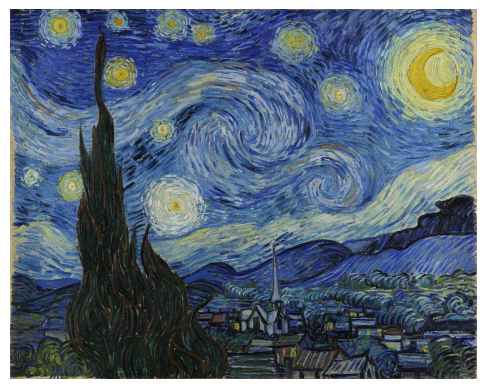

In [6]:
plot_target_img()

## Content Reconstructions

#### Key Idea

Start with a random noise image and iteratively optimize its pixels using Gradient Descent so that it produces the same feature activations (filter responses) as the target image.

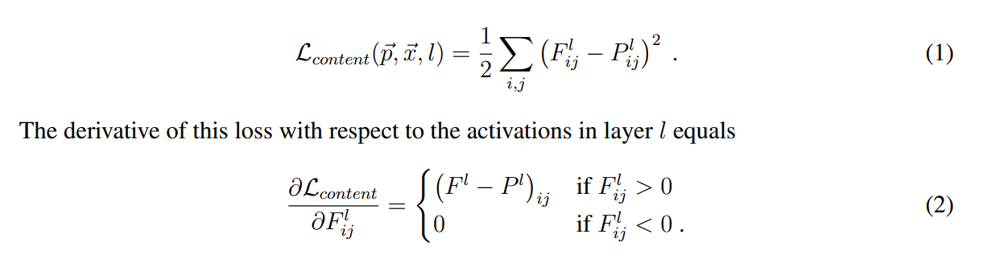

### How much information about the original image is preserved in a specific layer?

### Using Conv_1_1

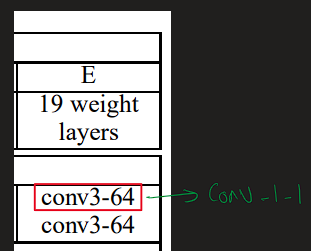

In [7]:
from PIL import Image

img = Image.open("target_img_05.png").convert("RGB")
model = model.to(device)

In [8]:
conv_1_1_feature = model.features.vgg_19_layers[0][0].block[:3]

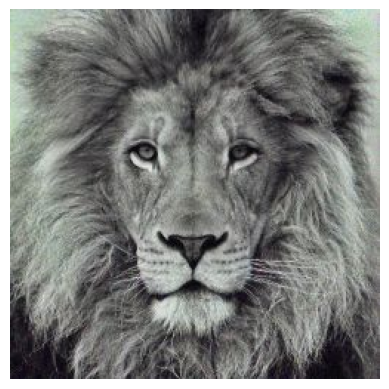

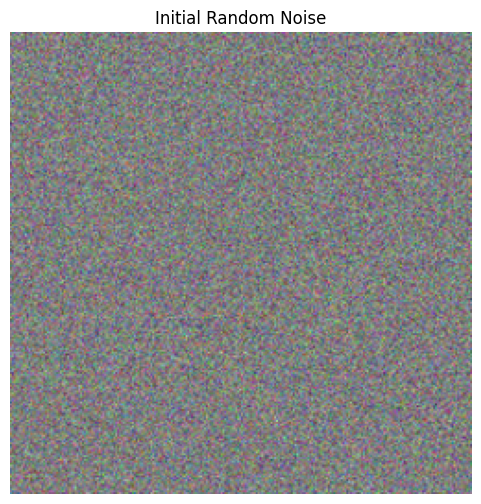

Epoch = [0/150] | Loss = 0.1843
Epoch = [100/150] | Loss = 0.0036


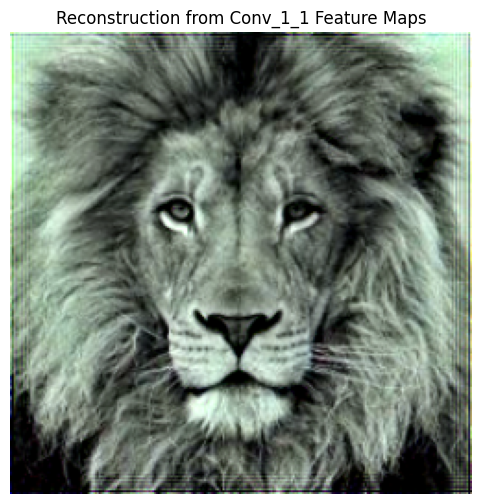

In [9]:
reconstruct_image(org_img = img, feature_layer = conv_1_1_feature, layer_name = "Conv_1_1")

## Using Conv_2_1

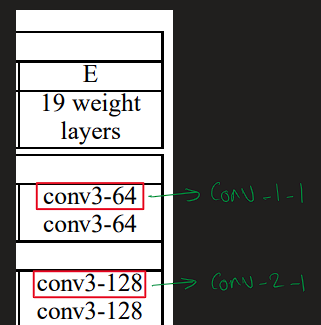

In [10]:
conv_2_1_feature = nn.Sequential(model.features.vgg_19_layers[0][0].block, model.features.vgg_19_layers[0][1], model.features.vgg_19_layers[1][0].block[:3])
conv_2_1_feature

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
  (1): MaxPool2d(
    (max_pool2d): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
)

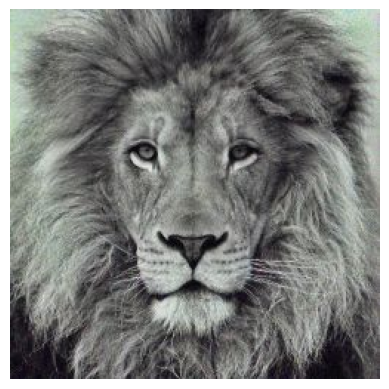

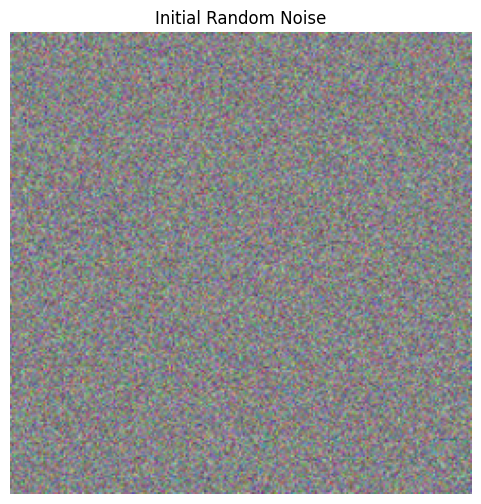

Epoch = [0/150] | Loss = 0.1742
Epoch = [100/150] | Loss = 0.0005


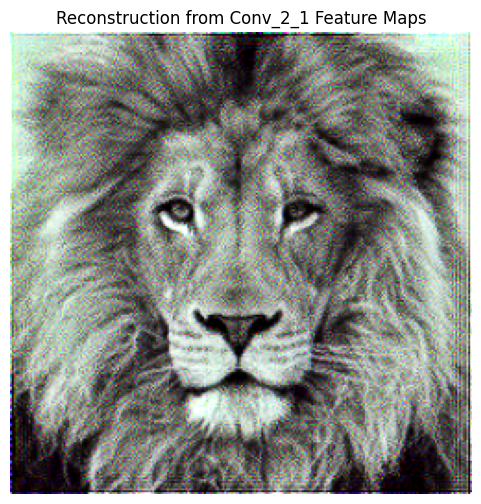

In [11]:
reconstruct_image(org_img = img, feature_layer = conv_2_1_feature, layer_name = "Conv_2_1")

## Using Conv_3_1

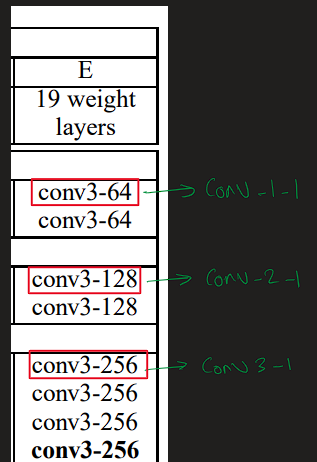

In [12]:
conv_3_1_feature = nn.Sequential(model.features.vgg_19_layers[:2], model.features.vgg_19_layers[2][0].block[:3])
conv_3_1_feature

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): VGGBlock(
        (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (batch_norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (batch_norm_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU()
        (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (block): Sequential(
          (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
          (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (5): ReLU()
        )
      )
      (1): MaxPool2d(
        (max_pool2d): MaxPool2d(kernel_size=2, stride=2, padding=

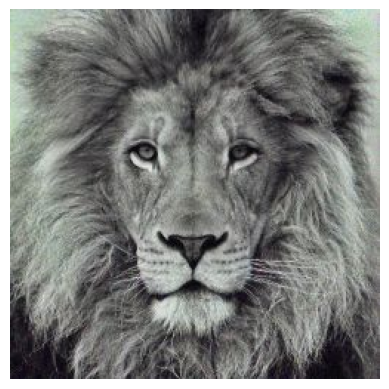

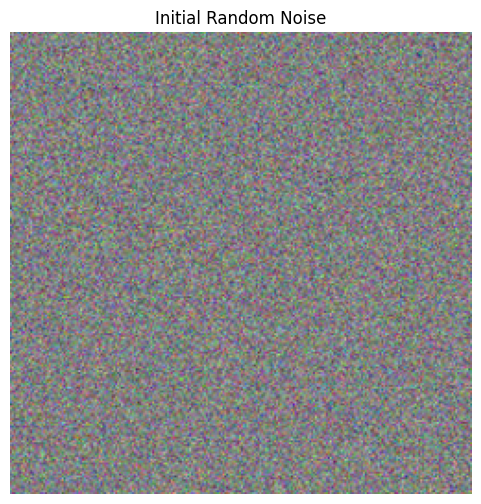

Epoch = [0/150] | Loss = 0.1661
Epoch = [100/150] | Loss = 0.0003


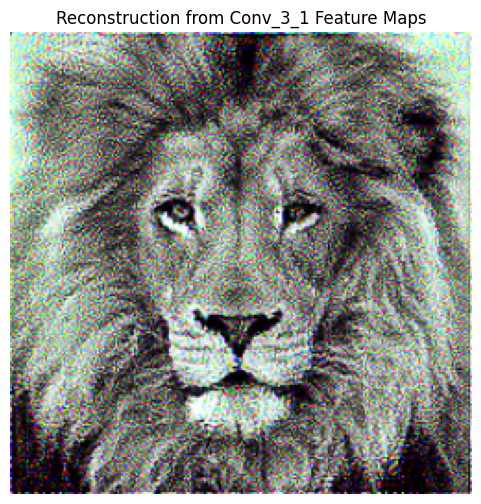

In [13]:
reconstruct_image(org_img = img, feature_layer = conv_3_1_feature, layer_name = "Conv_3_1")

### Using Conv_4_1

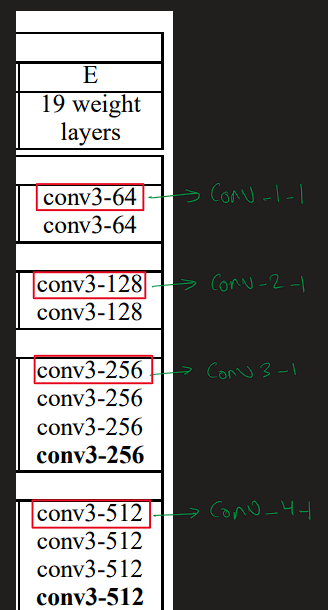

In [14]:
conv_4_1_feature = nn.Sequential(model.features.vgg_19_layers[:3], model.features.vgg_19_layers[3][0].block[:3])
conv_4_1_feature

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): VGGBlock(
        (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (batch_norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (batch_norm_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU()
        (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (block): Sequential(
          (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
          (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (5): ReLU()
        )
      )
      (1): MaxPool2d(
        (max_pool2d): MaxPool2d(kernel_size=2, stride=2, padding=

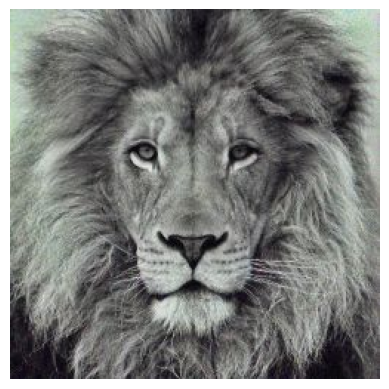

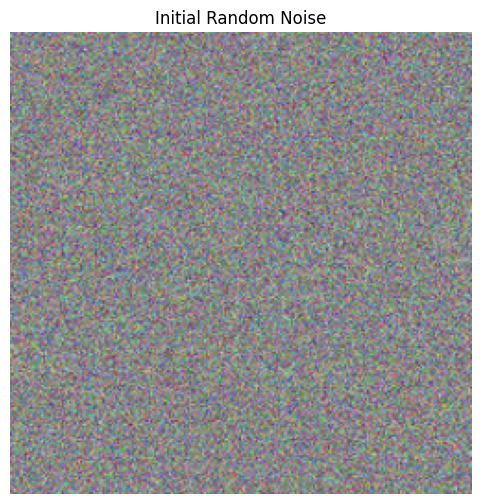

Epoch = [0/150] | Loss = 0.1416
Epoch = [100/150] | Loss = 0.0009


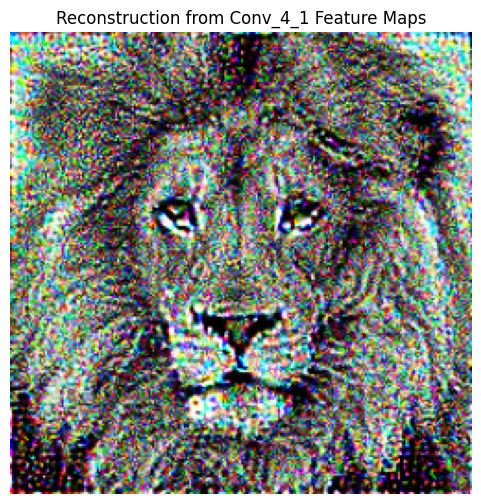

In [15]:
reconstruct_image(org_img = img, feature_layer = conv_4_1_feature, layer_name = "Conv_4_1")

### Using Conv_5_1

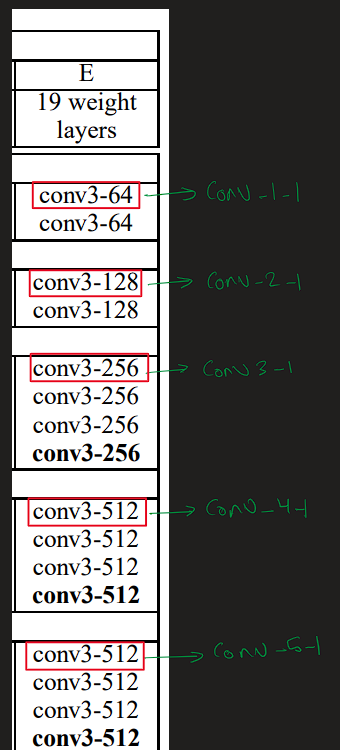

In [16]:
conv_5_1_feature = nn.Sequential(model.features.vgg_19_layers[:4], model.features.vgg_19_layers[4][0].block[:3])
conv_5_1_feature

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): VGGBlock(
        (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (batch_norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (batch_norm_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU()
        (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (block): Sequential(
          (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
          (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (5): ReLU()
        )
      )
      (1): MaxPool2d(
        (max_pool2d): MaxPool2d(kernel_size=2, stride=2, padding=

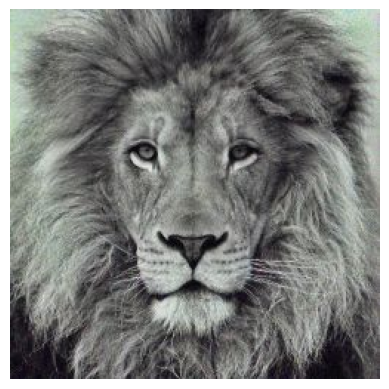

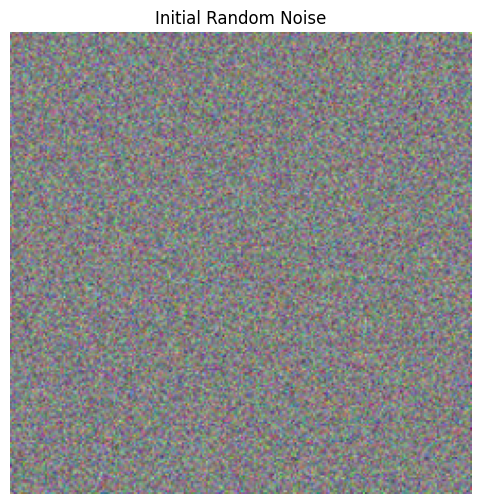

Epoch = [0/150] | Loss = 0.1127
Epoch = [100/150] | Loss = 0.0011


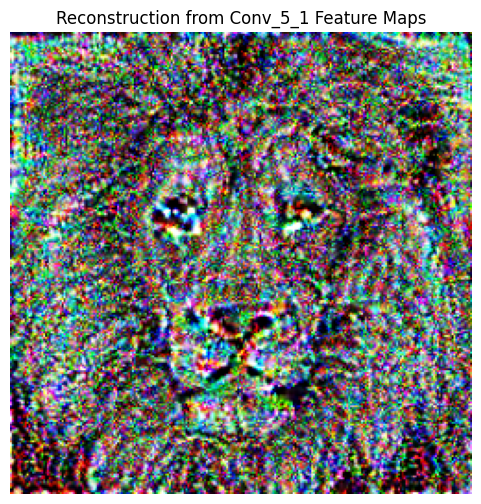

In [17]:
reconstruct_image(org_img = img, feature_layer = conv_5_1_feature, layer_name = "Conv_5_1")

## Observations

The image reconstruction experiment was performed by optimizing a randomly initialized noise image to match the feature representations of the target image at different layers of my custom VGG-19 network.

### Conv1_1
- Reconstruction is nearly identical to the original image.
- Fine details, colors, edges, and textures are preserved.
- Indicates that early layers primarily capture low-level visual features.

### Conv2_1
- The overall image structure remains highly accurate.
- Minor loss of fine-grained details is observed.
- The network still retains strong spatial and color information at this depth.

### Conv3_1
- The subject, pose, and major objects remain clearly recognizable.
- Reconstruction becomes noticeably noisier compared to earlier layers.
- Suggests that the network is beginning to focus on higher-level patterns rather than exact pixel information.

### Conv4_1
- The global scene structure is preserved.
- The person's position, clothing, and fan remain identifiable.
- Fine details and textures are increasingly lost, while semantic information remains.

### Conv5_1
- Despite significant noise, the image content remains recognizable.
- Object locations, pose, and overall composition are preserved.
- Indicates that deeper layers encode high-level semantic information rather than precise visual details.

### Overall Trend
As network depth increases:

1. Reconstruction quality gradually decreases.
2. Fine textures and pixel-level details are discarded.
3. High-level semantic structure is retained.
4. The network transitions from representing low-level visual features to abstract object-level information.


### Observation

Although the reconstruction loss converged rapidly (0.1145 → 0.0009 within 150 optimization steps), deeper layer reconstructions still contained significant visual noise.

This suggests that the optimization successfully matched the target feature representations, but the deeper layers themselves do not preserve exact pixel-level information. Instead, they primarily encode high-level semantic structure such as object identity, pose, and scene layout.

The fact that visually different images can produce nearly identical deep feature activations demonstrates that deeper CNN layers become increasingly invariant to low-level image details while retaining semantic content.

## Style Reconstruction

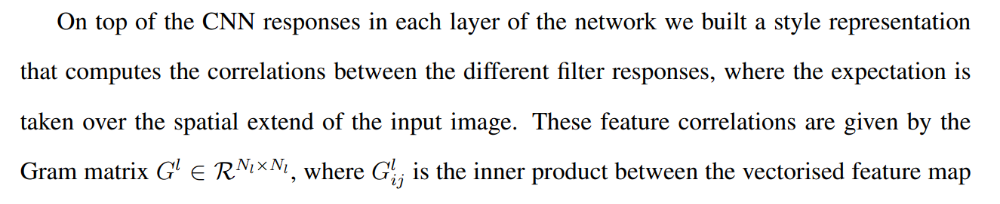

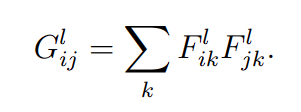

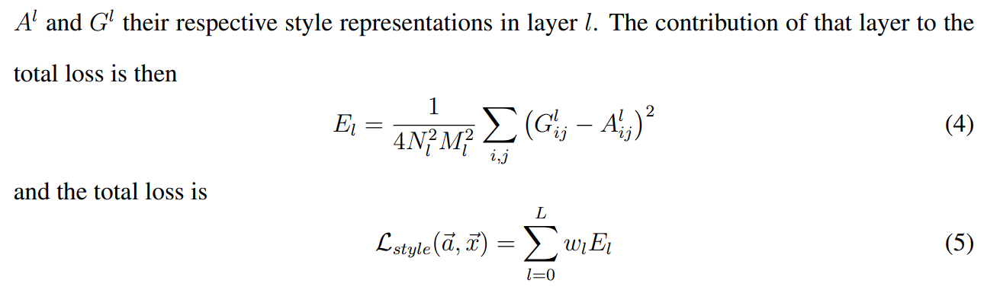

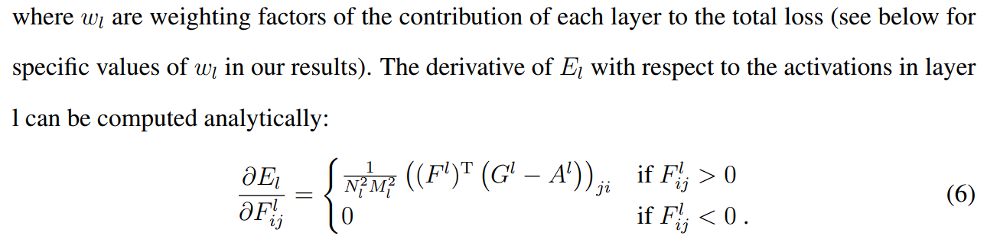

In [ ]:
conv_1_1 = model.features.vgg_19_blocks[0][0].block[:3]
img_tensor = val_transform(img).unsqueeze(0).to(device)
target_features = conv_1_1(img_tensor).detach().squeeze(0)
target_features = target_features.view(target_features.shape[0], -1)
gram_matrix = target_features @ target_features.T

In [95]:
def compute_gram_matrix(img_tensor, noise_tensor, layer):
    def compute_feature_maps(layer, x):
        features_maps = layer(x).detach().squeeze(0)
        features_maps = features_maps.view(features_maps.shape[0], -1)
        return features_maps
    
    target_feature_maps = compute_feature_maps(layer, img_tensor)
    noise_feature_maps = compute_feature_maps(layer, noise_tensor)

    img_gram_matrix = target_feature_maps @ target_feature_maps.T
    noise_gram_matrix = noise_feature_maps @ noise_feature_maps.T
    return img_gram_matrix, noise_gram_matrix

In [96]:
def compute_style_loss_per_layer(layer, img_tensor, noise_tensor):
    loss_fn = nn.MSELoss()
    target_feature_maps = layer(img_tensor).detach().squeeze(0).flatten(1)
    # C, HW = target_feature_maps.shape
    # img_gram_matrix = (target_feature_maps @ target_feature_maps.T) / (C * HW)
    img_gram_matrix = target_feature_maps @ target_feature_maps.T
    noise_feature_maps = layer(noise_tensor).squeeze(0).flatten(1)
    # noise_gram_matrix = (noise_feature_maps @ noise_feature_maps.T) / (C * HW)
    noise_gram_matrix = noise_feature_maps @ noise_feature_maps.T
    
    # Minimize the Loss b/w Gram Matrix
    loss = loss_fn(
        img_gram_matrix, noise_gram_matrix
    )
    return loss

In [97]:
def get_total_style_loss(layers, img_tensor, noise_tensor):
    total_style_loss = 0
    for layer, weights in layers.items():
        current_loss = compute_style_loss_per_layer(layer, img_tensor, noise_tensor)
        total_style_loss += current_loss * weights
    return total_style_loss


In [98]:
def style_gradient_descent(layers, img_tensor, noise_tensor, epochs = 10000):

    # loss_fn = nn.MSELoss()
    optimizer = torch.optim.Adam(params = [noise_tensor], lr = 0.01)

    # target_feature_maps = layer(img_tensor).detach().squeeze(0).flatten(1)
    # img_gram_matrix = target_feature_maps @ target_feature_maps.T
    for epoch in range(epochs):
        # img_gram_matrix, noise_gram_matrix = compute_gram_matrix(img_tensor, noise_tensor, layer = layer)
        # noise_gram_matrix = noise_gram_matrix.requires_grad_(True)
        
        # noise_feature_maps = layer(noise_tensor).squeeze(0).flatten(1)
        # noise_gram_matrix = noise_feature_maps @ noise_feature_maps.T 
        
        # Minimize the Loss b/w Gram Matrix
        # loss = loss_fn(
        #     img_gram_matrix, noise_gram_matrix
        # )
        # print(f"loss = {loss}")
        
        style_loss = get_total_style_loss(layers, img_tensor, noise_tensor)
        optimizer.zero_grad()
        style_loss.backward()
        optimizer.step()

        with torch.no_grad():
            noise_tensor.clamp_(0, 1)

        if epoch % 100 == 0:
            print(f"Epoch = [{epoch}/{epochs}] | Loss = {style_loss:.4f}")

    return noise_tensor

In [99]:
def get_styles(org_img, layer, layer_name):
    plot_target_img()
    img_tensor = val_transform(org_img).unsqueeze(0).to(device)
    noise_tensor = torch.rand_like(img_tensor).requires_grad_(True)
    plot_noise(org_img, noise_tensor, title = "Initial random Noise")
    noise_tensor = style_gradient_descent(layer, img_tensor, noise_tensor)
    plot_noise(org_img, noise_tensor, title = f"Generated Style using {layer_name}")

---

In [100]:
conv_1_1_feature = model.features.vgg_19_layers[0][0].block[:3]
conv_2_1_feature = nn.Sequential(model.features.vgg_19_layers[:1], model.features.vgg_19_layers[1][0].block[:3])
conv_3_1_feature = nn.Sequential(model.features.vgg_19_layers[:2], model.features.vgg_19_layers[2][0].block[:3])
conv_4_1_feature = nn.Sequential(model.features.vgg_19_layers[:3], model.features.vgg_19_layers[3][0].block[:3])
conv_5_1_feature = nn.Sequential(model.features.vgg_19_layers[:4], model.features.vgg_19_layers[4][0].block[:3])

In [101]:
A_layers = {
    conv_1_1_feature: 1/5
}
B_layers = {
    conv_1_1_feature: 1/5,
    conv_2_1_feature: 1/5
}
C_layers = {
    conv_1_1_feature: 1/5,
    conv_2_1_feature: 1/5,
    conv_3_1_feature: 1/5
}
D_layers = {
    conv_1_1_feature: 1/5,
    conv_2_1_feature: 1/5,
    conv_3_1_feature: 1/5,
    conv_4_1_feature: 1/5
}
E_layers = {
    conv_1_1_feature: 1/5,
    conv_2_1_feature: 1/5,
    conv_3_1_feature: 1/5,
    conv_4_1_feature: 1/5,
    conv_5_1_feature: 1/5,
}
layers = E_layers # default layer

### Generating Styles with Layer-A

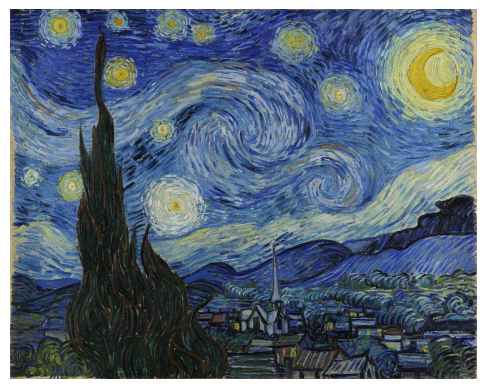

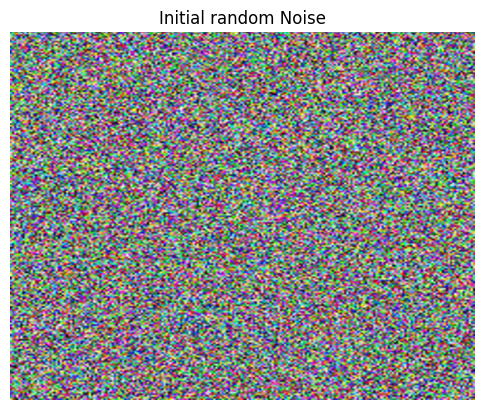

Epoch = [0/10000] | Loss = 585248.1875
Epoch = [100/10000] | Loss = 3107.9714
Epoch = [200/10000] | Loss = 493.9496
Epoch = [300/10000] | Loss = 234.6735
Epoch = [400/10000] | Loss = 142.4990
Epoch = [500/10000] | Loss = 96.7660
Epoch = [600/10000] | Loss = 70.3102
Epoch = [700/10000] | Loss = 53.4849
Epoch = [800/10000] | Loss = 42.0795
Epoch = [900/10000] | Loss = 33.9612
Epoch = [1000/10000] | Loss = 27.9574
Epoch = [1100/10000] | Loss = 23.3897
Epoch = [1200/10000] | Loss = 19.8362
Epoch = [1300/10000] | Loss = 17.0128
Epoch = [1400/10000] | Loss = 14.7371
Epoch = [1500/10000] | Loss = 12.8706
Epoch = [1600/10000] | Loss = 11.3142
Epoch = [1700/10000] | Loss = 10.0065
Epoch = [1800/10000] | Loss = 8.8976
Epoch = [1900/10000] | Loss = 7.9512
Epoch = [2000/10000] | Loss = 7.1345
Epoch = [2100/10000] | Loss = 6.4227
Epoch = [2200/10000] | Loss = 5.8006
Epoch = [2300/10000] | Loss = 5.2533
Epoch = [2400/10000] | Loss = 4.7706
Epoch = [2500/10000] | Loss = 4.3417
Epoch = [2600/10000] | 

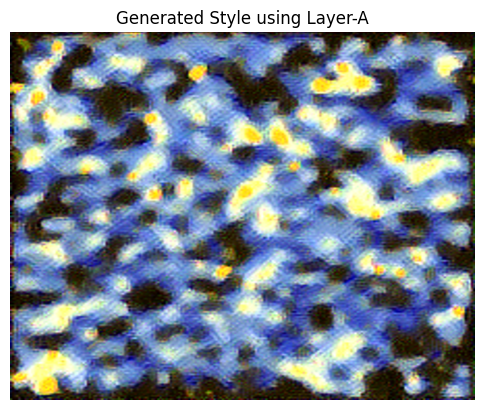

In [173]:
get_styles(org_img = img, layer = A_layers, layer_name = "Layer-A")

---

### Generating Styles with Layer-B

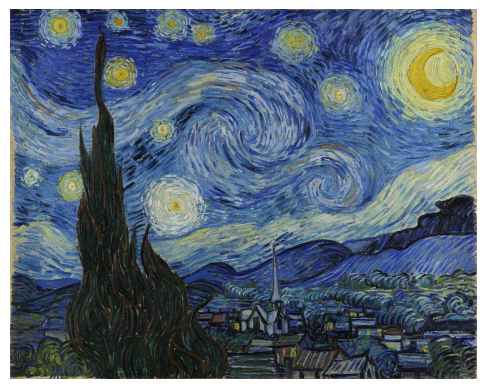

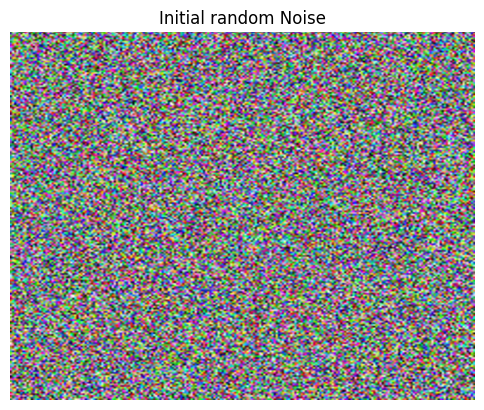

Epoch = [0/10000] | Loss = 588087.2500
Epoch = [100/10000] | Loss = 5399.5771
Epoch = [200/10000] | Loss = 1651.7317
Epoch = [300/10000] | Loss = 847.5763
Epoch = [400/10000] | Loss = 513.4908
Epoch = [500/10000] | Loss = 339.9508
Epoch = [600/10000] | Loss = 239.6630
Epoch = [700/10000] | Loss = 177.6026
Epoch = [800/10000] | Loss = 136.9008
Epoch = [900/10000] | Loss = 108.7542
Epoch = [1000/10000] | Loss = 88.4883
Epoch = [1100/10000] | Loss = 73.4779
Epoch = [1200/10000] | Loss = 61.9843
Epoch = [1300/10000] | Loss = 53.0128
Epoch = [1400/10000] | Loss = 45.8613
Epoch = [1500/10000] | Loss = 40.1204
Epoch = [1600/10000] | Loss = 35.4003
Epoch = [1700/10000] | Loss = 31.4702
Epoch = [1800/10000] | Loss = 28.1707
Epoch = [1900/10000] | Loss = 25.3603
Epoch = [2000/10000] | Loss = 22.9453
Epoch = [2100/10000] | Loss = 20.8649
Epoch = [2200/10000] | Loss = 19.0657
Epoch = [2300/10000] | Loss = 17.4929
Epoch = [2400/10000] | Loss = 16.1094
Epoch = [2500/10000] | Loss = 14.8887
Epoch = [

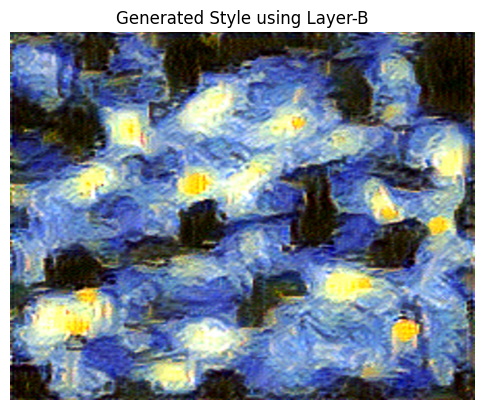

In [174]:
get_styles(org_img = img, layer = B_layers, layer_name = "Layer-B")

---

### Generating Styles with Layer-C

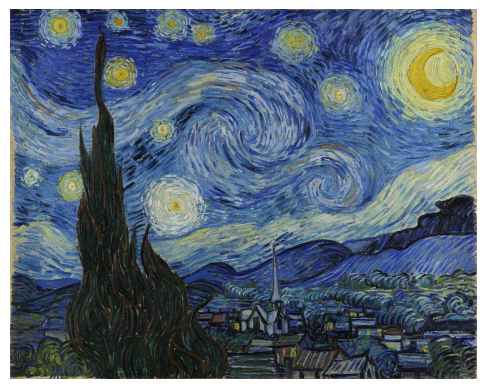

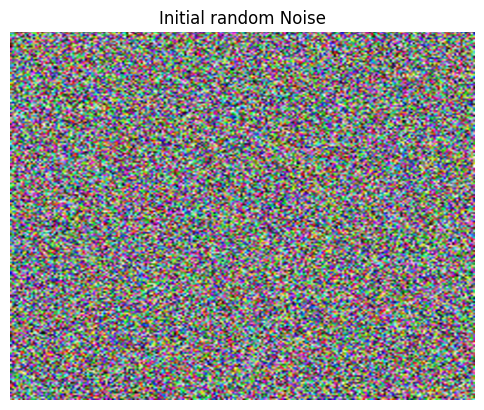

Epoch = [0/10000] | Loss = 587760.8750
Epoch = [100/10000] | Loss = 5753.0063
Epoch = [200/10000] | Loss = 1923.1938
Epoch = [300/10000] | Loss = 1025.6602
Epoch = [400/10000] | Loss = 641.4818
Epoch = [500/10000] | Loss = 440.5151
Epoch = [600/10000] | Loss = 321.3818
Epoch = [700/10000] | Loss = 244.4791
Epoch = [800/10000] | Loss = 192.5891
Epoch = [900/10000] | Loss = 155.9943
Epoch = [1000/10000] | Loss = 129.3731
Epoch = [1100/10000] | Loss = 109.2829
Epoch = [1200/10000] | Loss = 93.7164
Epoch = [1300/10000] | Loss = 81.3367
Epoch = [1400/10000] | Loss = 71.3363
Epoch = [1500/10000] | Loss = 63.1563
Epoch = [1600/10000] | Loss = 56.4373
Epoch = [1700/10000] | Loss = 50.8119
Epoch = [1800/10000] | Loss = 46.0196
Epoch = [1900/10000] | Loss = 41.8874
Epoch = [2000/10000] | Loss = 38.2821
Epoch = [2100/10000] | Loss = 35.1277
Epoch = [2200/10000] | Loss = 32.3529
Epoch = [2300/10000] | Loss = 29.8897
Epoch = [2400/10000] | Loss = 27.6900
Epoch = [2500/10000] | Loss = 25.7177
Epoch 

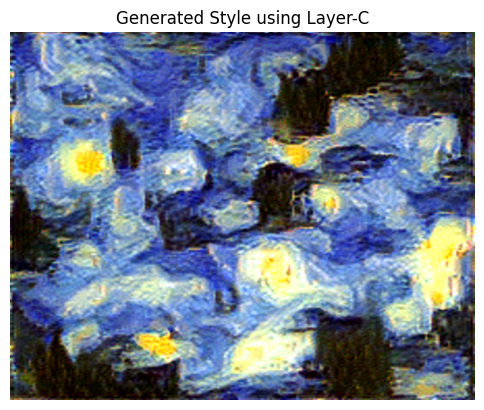

In [175]:
get_styles(org_img = img, layer = C_layers, layer_name = "Layer-C")

---

### Generating Styles with Layer-D

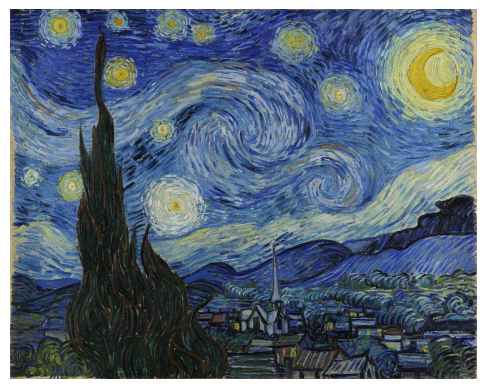

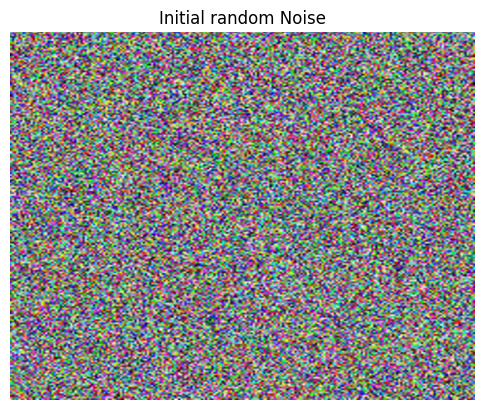

Epoch = [0/10000] | Loss = 589937.0000
Epoch = [100/10000] | Loss = 5078.7881
Epoch = [200/10000] | Loss = 1713.4722
Epoch = [300/10000] | Loss = 902.5013
Epoch = [400/10000] | Loss = 559.1190
Epoch = [500/10000] | Loss = 381.7656
Epoch = [600/10000] | Loss = 279.3825
Epoch = [700/10000] | Loss = 215.1214
Epoch = [800/10000] | Loss = 172.0529
Epoch = [900/10000] | Loss = 142.1089
Epoch = [1000/10000] | Loss = 120.4910
Epoch = [1100/10000] | Loss = 103.9734
Epoch = [1200/10000] | Loss = 91.0575
Epoch = [1300/10000] | Loss = 80.5778
Epoch = [1400/10000] | Loss = 71.9361
Epoch = [1500/10000] | Loss = 64.6658
Epoch = [1600/10000] | Loss = 58.5340
Epoch = [1700/10000] | Loss = 53.3102
Epoch = [1800/10000] | Loss = 48.8493
Epoch = [1900/10000] | Loss = 45.0108
Epoch = [2000/10000] | Loss = 41.6616
Epoch = [2100/10000] | Loss = 38.7156
Epoch = [2200/10000] | Loss = 36.1120
Epoch = [2300/10000] | Loss = 33.7834
Epoch = [2400/10000] | Loss = 31.6892
Epoch = [2500/10000] | Loss = 29.8075
Epoch =

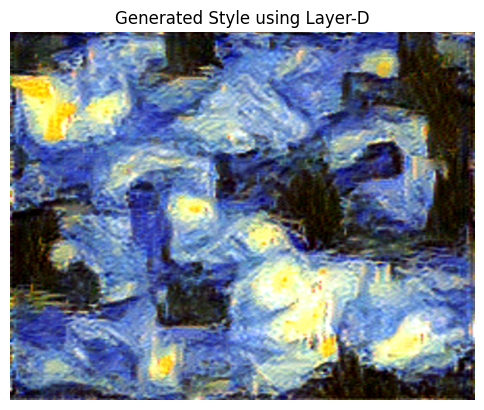

In [176]:
get_styles(org_img = img, layer = D_layers, layer_name = "Layer-D")

---

### Generating Styles with Layer-E

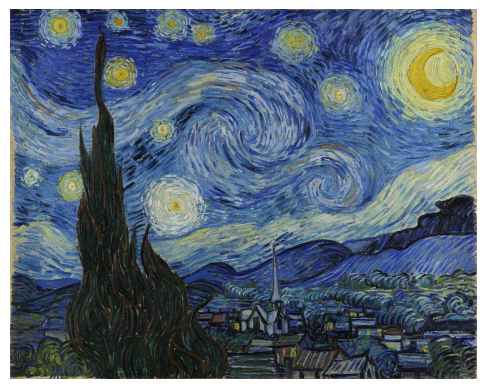

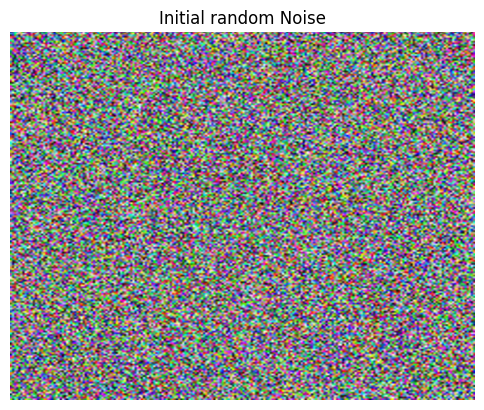

Epoch = [0/10000] | Loss = 590804.3125
Epoch = [100/10000] | Loss = 5268.3813
Epoch = [200/10000] | Loss = 1694.0198
Epoch = [300/10000] | Loss = 867.4448
Epoch = [400/10000] | Loss = 529.2841
Epoch = [500/10000] | Loss = 358.2631
Epoch = [600/10000] | Loss = 260.4933
Epoch = [700/10000] | Loss = 199.9269
Epoch = [800/10000] | Loss = 159.8562
Epoch = [900/10000] | Loss = 131.5611
Epoch = [1000/10000] | Loss = 110.6486
Epoch = [1100/10000] | Loss = 94.7106
Epoch = [1200/10000] | Loss = 82.2834
Epoch = [1300/10000] | Loss = 72.4328
Epoch = [1400/10000] | Loss = 64.5054
Epoch = [1500/10000] | Loss = 57.9876
Epoch = [1600/10000] | Loss = 52.5544
Epoch = [1700/10000] | Loss = 47.9919
Epoch = [1800/10000] | Loss = 44.1111
Epoch = [1900/10000] | Loss = 40.7489
Epoch = [2000/10000] | Loss = 37.8099
Epoch = [2100/10000] | Loss = 35.2185
Epoch = [2200/10000] | Loss = 32.9240
Epoch = [2300/10000] | Loss = 30.8761
Epoch = [2400/10000] | Loss = 29.0450
Epoch = [2500/10000] | Loss = 27.4007
Epoch = 

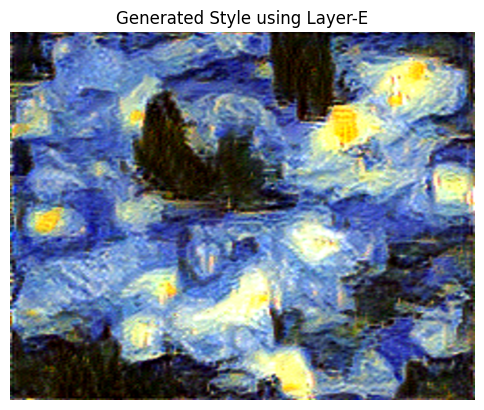

In [ ]:
get_styles(org_img = img, layer = layers, layer_name = "Layer-E")

### Observation

Although the style transfer result produced by my custom VGG-19 is less coherent than the result reported in the original paper, the generated image successfully captures several characteristic elements of the target style, including the blue-yellow color palette, brush-stroke textures, and local artistic patterns.

This suggests that the network has learned meaningful texture representations despite being trained on a significantly smaller dataset than the ImageNet-pretrained VGG-19 used in the paper.

The reduced global structure and weaker swirl patterns likely stem from differences in training data, network statistics (BatchNorm), and the quality of learned high-level feature representations.

---

### Important Observation

Unlike modern image generation models, the original Neural Style Transfer algorithm does not directly produce a stylized image through a single forward pass.

Instead, a pretrained CNN is used as a fixed feature extractor, while the pixels of a randomly initialized image are optimized using Gradient Descent. For every new content-style image pair, a separate optimization process must be performed.

This makes the original NST algorithm computationally expensive but also demonstrates that style and content can be represented and manipulated directly through CNN feature statistics.

---

### Combining Content Loss and Style Loss 

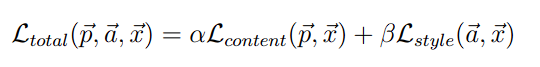

### Experimental Setup

Before reproducing the exact configuration proposed by Gatys et al., I first experimented with a symmetric setup where both content and style losses were computed using activations from:

- conv1_1
- conv2_1
- conv3_1
- conv4_1
- conv5_1

Each layer contributed equally with a weight of 1/5.

This differs from the original paper, where content loss is computed only from conv4_2, while style loss is computed from conv1_1 through conv5_1 with equal weighting.

The purpose of this experiment is to study how combining multiple content representations across different depths affects the final stylized image before adopting the authors' original formulation.

### Making end-to-end System

In [ ]:
## I'm planning to implement the NST Algorithm in a Modular way as,
# 1. ContentReconstructor
# 2. StyleReconstructor
# 3. NST

# So that the layer's are swappable with custom VGG19 Implementation to Original onces

In [38]:
# ---------------------------------------------- Content Related Layers -----------------------------------------------------
content_layers = nn.Sequential(*model.features.vgg_19_blocks[:3], model.features.vgg_19_blocks[3][0], model.features.vgg_19_blocks[3][2])

# ---------------------------------------------- Style Related Layers -----------------------------------------------------
conv_1_1_feature = model.features.vgg_19_layers[0][0].block[:3]
conv_2_1_feature = nn.Sequential(model.features.vgg_19_layers[:1], model.features.vgg_19_layers[1][0].block[:3])
conv_3_1_feature = nn.Sequential(model.features.vgg_19_layers[:2], model.features.vgg_19_layers[2][0].block[:3])
conv_4_1_feature = nn.Sequential(model.features.vgg_19_layers[:3], model.features.vgg_19_layers[3][0].block[:3])
conv_5_1_feature = nn.Sequential(model.features.vgg_19_layers[:4], model.features.vgg_19_layers[4][0].block[:3])
style_layers = {
    conv_1_1_feature: 1/2,
    conv_2_1_feature: 1/3,
    conv_3_1_feature: 1/3,
    conv_4_1_feature: 1/4,
    conv_5_1_feature: 1/4,
}

# ---------------------------------------------- NST Specific Settings -----------------------------------------------------
config = {
    "content_layers": content_layers,
    "style_layers": style_layers,
    "epochs": 5000,
    "alpha": 1,
    "beta": 1e-5,
    "img_size": 224,
    "loss_fn": nn.MSELoss()
}

wandb_config = {
    "content_layer": "conv4_2",
    "style_layers": [
        "conv1_1",
        "conv2_1",
        "conv3_1",
        "conv4_1",
        "conv5_1"
    ],
    "style_weights": [
        1/5,
        1/5,
        1/5,
        1/5,
        1/4
    ],
    "epochs": config["epochs"],
    "alpha": config["alpha"],
    "beta": config["beta"],
    "img_size": config["img_size"],
    "loss_fn": "MSELoss"
}

In [39]:
import wandb
class ContentReconstructor(nn.Module):
    """
    > This Implements the Original Content Reconstruction Algorithm discussed in the NST Paper, the implementation is responsible to
    reconstruct the input image from white noise, so that it have same effect on the learned activation maps
    of the VGG-19 Network [self-implemented or Original Implementation]

    > Optimizes the MSE Loss b/w feature maps produced by the Content Image and White Noise

    > Layer used for Content Reconstruction is:
        > Conv4_2 [A single loss from the final layer of Con4_2]
    
    NOTE: These layers are configurable via swapping from Custom VGG-19 Implementation to Original VGG-19 Implementaions

    Paper Name: A Neural Algorithm of Artistic Style
    Paper Link: https://arxiv.org/pdf/1508.06576
    """
    def __init__(self, layers, loss_fn):
        super().__init__()
        self.layers = layers
        self.loss_fn = loss_fn

    def forward(self, img_tensor, noise_tensor):
        img_tensor_feature_maps = self.layers(img_tensor).detach().squeeze(0).flatten(1)
        noise_tensor_feature_maps = self.layers(noise_tensor).squeeze(0).flatten(1)
        return self.loss_fn(img_tensor_feature_maps, noise_tensor_feature_maps)

class StyleReconstructor(nn.Module):
    """
    > This Implements the Original Style Reconstruction Algorithm discussed in the NST Paper, the implementation is responsible to
    construct an image from pure white noise, such that it matches the style of the provided style image, this is done via
    minimizing the Entries of Gram Matrix b/w Style Image and White Noise Image

    > Optimizes the MSE Loss b/w Entries of Gram Matrix produced by the Style Image and White Noise

    > Layer used for Style Reconstruction are:
        > Conv1_1, Conv2_1, Conv3_1, Conv4_1, Conv5_1 [Each layer contributes to the Loss Independently]

    NOTE: These layers are configurable via swapping from Custom VGG-19 Implementation to Original VGG-19 Implementaions
    
    NOTE: This implementation computes Gram Matrices directly as G = FFᵀ
        without applying Gram Matrix normalization. Consequently, style
        losses have a significantly larger magnitude than content losses.
        To balance optimization, a smaller style weighting coefficient
        (β = 1e-6) is used during Neural Style Transfer experiments.

    Paper Name: A Neural Algorithm of Artistic Style
    Paper Link: https://arxiv.org/pdf/1508.06576
    """
    def __init__(self, layers, loss_fn):
        super().__init__()
        self.layers = layers
        self.loss_fn = loss_fn

    def forward(self, img_tensor, noise_tensor):
        total_style_loss = self._get_total_style_loss(img_tensor, noise_tensor)
        return total_style_loss
    
    def _get_gram_matrix(self, feature_maps):
        return feature_maps @ feature_maps.T
    
    def _compute_style_loss_per_layer(self, layer, img_tensor, noise_tensor):
        target_feature_maps = layer(img_tensor).detach().squeeze(0).flatten(1)
        img_gram_matrix = self._get_gram_matrix(target_feature_maps)
        noise_feature_maps = layer(noise_tensor).squeeze(0).flatten(1)
        noise_gram_matrix = self._get_gram_matrix(noise_feature_maps)
        
        # Minimize the Loss b/w Gram Matrix
        loss = self.loss_fn(
            img_gram_matrix, noise_gram_matrix
        )
        return loss    

    def _get_total_style_loss(self, img_tensor, noise_tensor):
        total_style_loss = 0
        for layer, weights in self.layers.items():
            current_loss = self._compute_style_loss_per_layer(layer, img_tensor, noise_tensor)
            total_style_loss += current_loss * weights
        return total_style_loss   


class NST(nn.Module):
    """
    This class performs Neural Style Transfer by synthesizing a new image
    from a content image and a style image.

    Paper Name: A Neural Algorithm of Artistic Style
    Paper Link: https://arxiv.org/pdf/1508.06576
    """
    def __init__(self,
                content_layers = config["content_layers"],
                style_layers = config["style_layers"],
                epochs = config["epochs"],
                alpha = config["alpha"],
                beta = config["beta"],
                loss_fn = config["loss_fn"]):
        super().__init__()
        self.content_layers = content_layers
        self.style_layers = style_layers
        self.epochs = epochs
        self.alpha = alpha
        self.beta = beta
        self.loss_fn = loss_fn

        self.content_reconstructor = ContentReconstructor(layers = self.content_layers, loss_fn = self.loss_fn)
        self.style_reconstructor = StyleReconstructor(layers = self.style_layers, loss_fn = self.loss_fn)
    
    def forward(self, content_img_tensor, style_img_tensor, noise_tensor):
        self.eval()
        return self._gradient_descent(content_img_tensor, style_img_tensor, noise_tensor)

    def _gradient_descent(self, content_img_tensor, style_img_tensor, noise_tensor):
        wandb.init(
            project="neural-style-transfer",
            name="nst_vgg19",
            config = wandb_config,
            tags=[
                "neural-style-transfer",
                "nst",
                "vgg19",
                "custom-vgg19",
                "style-transfer",
                "gram-matrix",
                "paper-reproduction",
                "gatys-et-al"
            ]

        )
        # For wandb plotting
        content_losses = []
        style_losses = []
        total_losses = []

        optimizer = torch.optim.Adam(params = [noise_tensor], lr = 0.01)

        for epoch in range(self.epochs):
            content_loss = self.content_reconstructor(content_img_tensor, noise_tensor)
            style_loss = self.style_reconstructor(style_img_tensor, noise_tensor)

            total_loss = self.alpha * content_loss + self.beta * style_loss
            optimizer.zero_grad()
            total_loss.backward()
            optimizer.step()

            content_losses.append(content_loss.item())
            style_losses.append(style_loss.item())
            total_losses.append(total_loss.item())

            wandb.log({
                "content_loss": content_loss.item(),
                "style_loss": style_loss.item(),
                "total_loss": total_loss.item(),
                "epoch": epoch
            })

            with torch.no_grad(): # After updating the noise_tensor, make sure it stays in range of [0, 1]
                noise_tensor.clamp_(0, 1)

            if epoch % 100 == 0:
                print(f"Epoch = [{epoch}/{self.epochs}] | Content Loss = {content_loss.item():.4f} | Style Loss = {style_loss.item():.4f} | Total Loss = {total_loss.item():.4f}")
        
        wandb.finish()
        return noise_tensor


class TransferStyle(nn.Module):
    def __init__(self, content_img_path, style_img_path, _val_transform, device):
        super().__init__()

        self.content_img_path = content_img_path
        self.style_img_path = style_img_path

        self.content_img = Image.open(self.content_img_path)
        self.style_img = Image.open(self.style_img_path)

        self._val_transform = _val_transform

        self.device = device
        self.nst = NST()

    def forward(self):
        return self._get_styled_img()

    def _get_styled_img(self):
        # Plot Content and Style Images
        self._plot_img(path = self.content_img_path, title = "Content Image") # content image
        self._plot_img(path = self.style_img_path, title = "Style Image") # style image

        # Apply the Validation Transform on Content and Style Transform according to VGG-19's Implementation
        content_img_tensor = self._val_transform(self.content_img).unsqueeze(0).to(self.device)
        style_img_tensor = self._val_transform(self.style_img).unsqueeze(0).to(self.device)
        noise_tensor = torch.rand_like(content_img_tensor).requires_grad_(True)

        # Plot Initial Random Noise Tensor
        self._plot_noise(org_img = self.style_img, noise_tensor = noise_tensor, title = "Initial random Noise")

        # Generate Image using NST Algorithm, creates the Optimizer internally
        generated_image = self.nst(
                content_img_tensor = content_img_tensor,
                style_img_tensor = style_img_tensor,
                noise_tensor = noise_tensor
        )

        # Plot Final Generated Image
        self._plot_noise(org_img = self.content_img, noise_tensor = generated_image, title = f"Generated Image")
        return generated_image
    
    def _plot_img(self, path, title = None):
        img = Image.open(path)
        plt.imshow(img)
        if title is not None:
            plt.title(title)
        plt.axis("off")
        plt.show()
    
    def _plot_noise(self, org_img, noise_tensor, title=""):
        img = (
            noise_tensor.detach()
            .cpu()
            .squeeze(0)
            .permute(1, 2, 0)
            .numpy()
        )

        img = (img - img.min()) / (img.max() - img.min())

        # Resize back to original dimensions
        img = Image.fromarray((img * 255).astype("uint8"))
        img = img.resize(
            org_img.size,
            Image.Resampling.BICUBIC
        )

        plt.figure(figsize=(6, 6))
        plt.imshow(img)

        if title:
            plt.title(title)

        plt.axis("off")
        plt.show()

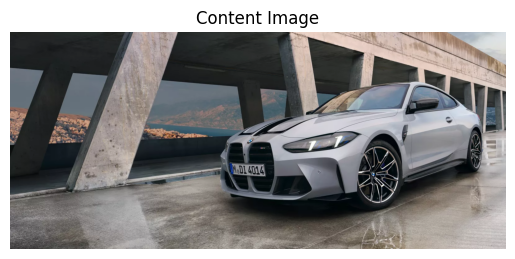

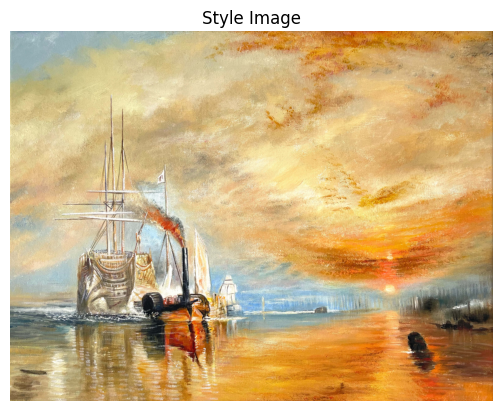

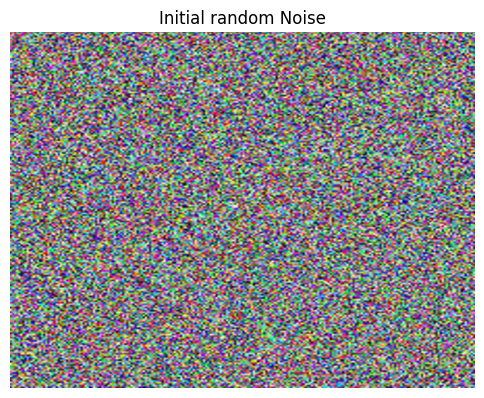

Epoch = [0/5000] | Content Loss = 0.2540 | Style Loss = 26945572.0000 | Total Loss = 269.7097


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IMAGE_SIZE = config["img_size"]
val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])
style_transfer = TransferStyle(
    content_img_path = "target_img_01.png",
    style_img_path = "target_img_08.png",
    _val_transform = val_transform,
    device = device
)

generated_img_tensor = style_transfer()